## FINAL PROJECT

| Mã số sinh viên | Họ tên           |
| --------------- | --------------- |
| 20120352        | Vũ Hoàng Phúc   |
| 20120322        |Đặng Thiên Long  |
| 20120236        |Phạm Tấn Anh Vũ  |

**Link github**: https://github.com/phuccr7/coding4DS

## 1. Import các thư viện cần thiết

In [47]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from math import ceil
from IPython.display import display, HTML
from collections import Counter
import plotly.express as px
from plotly.subplots import make_subplots
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import LabelEncoder
pd.set_option('display.max_columns', None)

## 2. Thu thập dữ liệu

### Football Players Data

Bộ dữ liệu này cung cấp thông tin chi tiết khoảng 17000 cầu thủ bóng đá của FIFA, được thu thập từ SoFIFA.com.

Nó bao gồm một loại các dữ liệu cụ thể của cầu thủ bao gồm tên , quốc tịch, câu lạc bộ, xếp hạng cầu thủ, tiềm năng, vị trí , tuổi tác và nhiều thuộc tính khác nữa. Bộ dữ liệu này lý tưởng cho những người yêu thích bóng đá, các nhà phân tích dữ liệu và những người nghiên cữu muốn tiến hành phân tích sâu, nghiên cứu thống kê hoặc thực hiện những dự án máy học liên quan tới đặc điểm, sự tiến triển sự nghiệp của các cầu thủ bóng đá. 

**License**: Apache 2.0  :  Giấy phép này cho phép người dùng có thể tự do  sử dụng tập dữ liệu với mọi mục đích mà không có bất kỳ rủi ro nào.

**Cách tác giả thu thập dữ liệu:**  Crawl dữ liệu các cầu thủ từ web https://sofifa.com./

**Nguồn**: https://www.kaggle.com/datasets/maso0dahmed/football-players-data

## 3. Khám phá dữ liệu

### Load dữ liệu

In [48]:
df=pd.read_csv('./data/fifa_players.csv')
df.head()

,name,full_name,birth_date,age,height_cm,weight_kgs,positions,nationality,overall_rating,potential,value_euro,wage_euro,preferred_foot,international_reputation(1-5),weak_foot(1-5),skill_moves(1-5),body_type,release_clause_euro,national_team,national_rating,national_team_position,national_jersey_number,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,freekick_accuracy,long_passing,ball_control,acceleration,sprint_speed,agility,reactions,balance,shot_power,jumping,stamina,strength,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle
0,L. Messi,Lionel Andrés Messi Cuccittini,6/24/1987,31,170.18,72.1,"CF,RW,ST",Argentina,94,94,110500000.0,565000.0,Left,5,4,4,Messi,226500000.0,Argentina,82.0,RF,10.0,86,95,70,92,86,97,93,94,89,96,91,86,93,95,95,85,68,72,66,94,48,22,94,94,75,96,33,28,26
1,C. Eriksen,Christian Dannemann Eriksen,2/14/1992,27,154.94,76.2,"CAM,RM,CM",Denmark,88,89,69500000.0,205000.0,Right,3,5,4,Lean,133800000.0,Denmark,78.0,CAM,10.0,88,81,52,91,80,84,86,87,89,91,76,73,80,88,81,84,50,92,58,89,46,56,84,91,67,88,59,57,22
2,P. Pogba,Paul Pogba,3/15/1993,25,190.50,83.9,"CM,CAM",France,88,91,73000000.0,255000.0,Right,4,4,5,Normal,144200000.0,France,84.0,RDM,6.0,80,75,75,86,85,87,85,82,90,90,71,79,76,82,66,90,83,88,87,82,78,64,82,88,82,87,63,67,67
3,L. Insigne,Lorenzo Insigne,6/4/1991,27,162.56,59.0,"LW,ST",Italy,88,88,62000000.0,165000.0,Right,3,4,4,Normal,105400000.0,Italy,83.0,LW,10.0,86,77,56,85,74,90,87,77,78,93,94,86,94,83,93,75,53,75,44,84,34,26,83,87,61,83,51,24,22
4,K. Koulibaly,Kalidou Koulibaly,6/20/1991,27,187.96,88.9,CB,Senegal,88,91,60000000.0,135000.0,Right,3,3,2,Normal,106500000.0,NaN,NaN,NaN,NaN,30,22,83,68,14,69,28,28,60,63,70,75,50,82,40,55,81,75,94,15,87,88,24,49,33,80,91,88,87


### Dữ liệu có bao nhiêu dòng bao và bao nhiêu cột

In [49]:
n_rows,n_cols=df.shape
print(f'Số dòng : ', n_rows)
print(f'Số cột :', n_cols)

Số dòng :  17954
Số cột : 51


Như vậy ta thấy dữ liệu đưa vào có 17954 dòng và 51 cột

### Các dòng dữ liệu

#### Ý nghĩa của từng dòng dữ liệu ?

In [50]:
df.sample(10)

,name,full_name,birth_date,age,height_cm,weight_kgs,positions,nationality,overall_rating,potential,value_euro,wage_euro,preferred_foot,international_reputation(1-5),weak_foot(1-5),skill_moves(1-5),body_type,release_clause_euro,national_team,national_rating,national_team_position,national_jersey_number,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,freekick_accuracy,long_passing,ball_control,acceleration,sprint_speed,agility,reactions,balance,shot_power,jumping,stamina,strength,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle
11071,F. Ananou,Kangni Frederic Ananou,9/20/1997,21,182.88,78.0,"RB,CB",Germany,66,76,900000.0,5000.0,Right,1,2,2,Normal,1600000.0,NaN,NaN,NaN,NaN,59,30,65,57,41,53,27,32,40,58,76,73,68,60,63,45,77,72,69,43,69,64,55,30,45,54,67,67,62
5719,S. Baptiste,Shandon Baptiste,4/8/1998,20,154.94,67.1,CM,Grenada,55,71,190000.0,1000.0,Right,1,3,2,Normal,451000.0,NaN,NaN,NaN,NaN,36,36,52,60,32,50,35,38,56,57,56,61,55,56,56,48,61,55,52,35,54,52,40,54,37,37,42,54,49
7700,Z. Dearnley,Zachary Dearnley,9/28/1998,20,175.26,66.2,"RW,LW,ST",England,61,76,550000.0,9000.0,Right,1,4,3,Normal,NaN,NaN,NaN,NaN,NaN,56,55,58,59,40,64,48,48,57,63,71,75,67,53,67,64,56,55,61,49,64,48,64,56,53,50,19,30,31
4247,J. Tratt,Jacob Tratt,9/14/1994,24,190.50,84.8,"RB,CB",Australia,58,65,150000.0,1000.0,Right,1,2,2,Normal,218000.0,NaN,NaN,NaN,NaN,54,39,58,56,29,54,39,33,49,56,64,66,56,54,52,45,68,66,77,32,67,54,45,45,36,44,60,57,51
132,V. Aboubakar,Vincent Paté Aboubakar,1/22/1992,27,182.88,82.1,ST,Cameroon,80,81,17500000.0,19000.0,Right,3,3,5,Normal,36300000.0,FC Porto,81.0,SUB,9.0,57,80,77,75,81,81,80,67,68,80,76,83,72,76,63,81,78,82,85,75,77,33,80,81,76,86,44,23,19
3374,D. Bowditch,Dean Peter Bowditch,6/15/1986,32,154.94,72.1,"CAM,RM,LM",England,63,63,290000.0,3000.0,Right,1,3,2,Normal,508000.0,NaN,NaN,NaN,NaN,61,57,30,64,52,58,65,66,48,59,62,62,73,63,69,61,71,69,57,63,56,48,63,66,59,55,39,50,50
417,M. Grujić,Marko Grujić,4/13/1996,22,190.50,82.1,"CDM,CM",Serbia,76,86,11000000.0,64000.0,Right,1,3,3,Normal,NaN,NaN,NaN,NaN,NaN,60,71,78,78,61,79,60,51,74,78,59,67,68,75,52,75,76,75,77,64,77,71,75,77,57,83,69,74,73
17152,P. Herrmann,Patrick Herrmann,2/12/1991,28,152.40,69.9,"RM,RW",Germany,77,77,9500000.0,29000.0,Right,2,2,3,Lean,16200000.0,NaN,NaN,NaN,NaN,77,65,54,74,70,79,74,60,64,77,79,83,83,77,75,74,69,64,56,70,58,29,79,77,62,65,28,26,54
14271,Paulo Henrique,Paulo Henrique Carneiro Filho,3/13/1989,29,185.42,79.8,"ST,LW",Brazil,70,70,1800000.0,12000.0,Right,1,4,3,Normal,3600000.0,NaN,NaN,NaN,NaN,58,69,72,60,65,72,62,61,56,68,67,64,71,68,76,75,82,73,75,69,66,24,69,65,64,70,41,28,21
9662,C. Burgess,Christian Burgess,10/7/1991,27,195.58,83.9,CB,England,64,67,475000.0,3000.0,Right,1,3,2,Lean,867000.0,NaN,NaN,NaN,NaN,30,20,68,52,29,52,31,25,62,51,58,53,32,53,54,41,77,74,82,21,69,53,23,36,34,45,63,65,62


• Mỗi dòng trong tập dữ liệu trên ứng với thông tin của một cầu thủ thuộc FIFA . Nhìn chung ta không thấy có dòng nào bị lạc loài ( có ý nghĩa khác so với các dòng còn lại)

#### Dữ liệu có bị lặp hay không ?

In [51]:
is_duplicated=df.duplicated().any()
is_duplicated

False

- Vì dữ liệu không bị lặp nên ta không cần tiến hành xử lý lặp. 

### Các cột dữ liệu

#### Mỗi cột có ý nghĩa gì ?

In [52]:


# Lấy danh sách các cột từ DataFrame
columns = list(df.columns.values)

# Hiển thị toàn bộ danh sách các cột
display(HTML("<table><tr>{}</tr></table>".format(
    "</tr><tr>".join("<td>{}</td>".format(column) for column in columns)
)))


name
full_name
birth_date
age
height_cm
weight_kgs
positions
nationality
overall_rating
potential
value_euro


| Column                         | Description                                                      |
| ------------------------------ | -----------------------------------------------------------------|
| name                           | Tên cầu thủ                                                      |
| full_name                      | Tên đầy đủ                                                       |
| birth_date                     | Ngày sinh                                                        |
| age                            | Tuổi                                                             |
| height_cm                      | Chiều cao (Đơn vị: cm)                                           |
| weight_kgs                     | Cân nặng (Đơn vị: kg)                                            |
| positions                      | Vị trí chơi của cầu thủ                                          |
| nationality                    | Quốc tịch                                                        |
| overall_rating                 | Điểm đánh giá tổng quát theo FIFA                                |
| potential                      | Điểm đánh giá tiềm năng theo thang điểm của FIFA                 |
| value_euro                     | Giá trị chuyển nhượng (Đơn vị: Euro)                             |
| wage_euro                      | Lương tính theo tuần (Đơn vị: Euro)                              |
| preferred_foot                 | Chân thuận                                                       |
| international_reputation(1-5)  | Đánh giá độ nổi tiếng từ 1-5                                     |
| weak_foot(1-5)                 | Đánh giá chân không thuận từ 1-5                                 |
| skill_moves(1-5)               | Đánh giá khả năng kĩ thuật từ 1-5                                |
| body_type                      | Loại thể hình                                                    |
| release_clause_euro            | Điều khoản giải phóng hợp đồng (Đơn vị: Euro)                    | 
| national_team                  | Đội tuyển quốc gia                                               |
| national_rating                | Xếp hạng của đội tuyển quốc gia                                  |
| national_team_position         | Vị trí chơi tại đội tuyển quốc gia                               |
| national_jersey_number         | Số áo ở đội tuyển quốc gia                                       |
| crossing                       | Chỉ số tạt bóng                                                  |
| finishing                      | Chỉ số dứt điểm                                                  |
| heading_accuracy               | Chỉ số đánh đầu                                                  |
| short_passing                  | Chỉ số chuyền ngắn                                               |
| volleys                        | Chỉ số vô lê                                                     |
| dribbling                      | Chỉ số rê bóng                                                   |
| curve                          | Chỉ số sút xoáy                                                  |
| freekick_accuracy              | Chỉ số đá phạt                                                   |
| long_passing                   | Chỉ số chuyền dài                                                |
| ball_control                   | Chỉ số kiểm soát bóng                                            |
| acceleration                   | Chỉ số tăng tốc                                                  |
| sprint_speed                   | Chỉ số chạy lướt rút                                             |
| agility                        | Chỉ số nhanh nhẹn                                                |
| reactions                      | Chỉ số phản ứng                                                  |
| balance                        | Chỉ số thăng bằng                                                |
| shot_power                     | Chỉ số lực sút                                                   |
| jumping                        | Chỉ số nhảy                                                      |
| stamina                        | Chỉ số sức bền                                                   |
| strength                       | Chỉ số thể lực                                                   |
| long_shots                     | Chỉ số sút xa                                                    |
| aggression                     | Chỉ số quyết liệt                                                |
| interceptions                  | Chỉ số đánh chặn                                                 |
| positioning                    | Chỉ số chọn vị trí                                               |
| vision                         | Chỉ số nhãn quan                                                 |
| penalties                      | Chỉ số sút penalty                                               |
| composure                      | Chỉ số bình tĩnh                                                 |
| marking                        | Chỉ số theo kèm                                                  |
| standing_tackle                | Chỉ số tắc bóng                                                  |
| sliding_tackle                 | Chỉ số xoạc bóng                                                 |


**Nhận xét**

- Ở đây có rất nhiều cột dữ liệu. Tuy nhiên các cột dữ liệu gồm một số loại chính: 
    - Thông tin cá nhân
    - Thông tin đội tuyển quốc gia
    - Thông số chuyên môn
- Để có thể dễ dàng theo dõi và phân tích ta có thể lược bỏ một số cột không cần thiết, ... 

#### Mỗi cột đang có kiểu dữ liệu gì? Có cột nào có kiểu dữ liệu chưa phù hợp không ?

In [53]:

df.dtypes


name                              object
full_name                         object
birth_date                        object
age                                int64
height_cm                        float64
weight_kgs                       float64
positions                         object
nationality                       object
overall_rating                     int64
potential                          int64
value_euro                       float64
wage_euro                        float64
preferred_foot                    object
international_reputation(1-5)      int64
weak_foot(1-5)                     int64
skill_moves(1-5)                   int64
body_type                         object
release_clause_euro              float64
national_team                     object
national_rating                  float64
national_team_position            object
national_jersey_number           float64
crossing                           int64
finishing                          int64
heading_accuracy

### Nhận xét:
- Hầu như các cột đã có dữ liệu phù hợp tuy nhiên cột `birth_date` tức là ngày sinh nên được chuyển sang dạng `datetime`

#### Chuyển kiểu dữ liệu của cột `birth_date` thành `datetime`

In [54]:
# Chuyển cột birth_date sang dạng datetime
df['birth_date'] = pd.to_datetime(df['birth_date'])

# Kiểm tra lại kiểu dữ liệu của cột birth_date
df['birth_date'].head(10)

0   1987-06-24
1   1992-02-14
2   1993-03-15
3   1991-06-04
4   1991-06-20
5   1991-07-08
6   1998-12-20
7   1988-06-02
8   1986-03-27
9   1987-02-14
Name: birth_date, dtype: datetime64[ns]

#### Với những cột dữ liệu dạng số (numerical) các giá trị được phân bố như nào ?

#### Số giá trị, giá trị trung bình, độ lệch chuẩn, min, 25 %, 50%, 70%, max của các cột dữ liệu số

In [55]:
df.describe()

,age,height_cm,weight_kgs,overall_rating,potential,value_euro,wage_euro,international_reputation(1-5),weak_foot(1-5),skill_moves(1-5),release_clause_euro,national_rating,national_jersey_number,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,freekick_accuracy,long_passing,ball_control,acceleration,sprint_speed,agility,reactions,balance,shot_power,jumping,stamina,strength,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle
count,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,1.769900e+04,17708.000000,17954.000000,17954.000000,17954.000000,1.611700e+04,857.000000,857.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000
mean,25.565445,174.946921,75.301047,66.240169,71.430935,2.479280e+06,9902.134628,1.111674,2.945695,2.361034,4.622522e+06,76.341890,12.456243,49.697672,45.358249,52.148212,58.566058,42.755208,55.278991,47.101147,42.688092,52.667428,58.223906,64.696224,64.803498,63.377465,61.821878,63.870057,55.319873,64.955219,63.133842,65.158850,46.852456,55.816531,46.657959,49.857302,53.406260,48.357302,58.680183,47.162861,47.733040,45.705915
std,4.705708,14.029449,7.083684,6.963730,6.131339,5.687014e+06,21995.593750,0.392168,0.663691,0.763223,1.129077e+07,4.786667,8.098157,18.483310,19.640792,17.521819,14.863178,17.802936,19.091876,18.536621,17.565634,15.421545,16.875717,15.001345,14.722750,14.806946,9.075675,14.174038,17.351295,11.705711,15.917554,12.535955,19.429337,17.394047,20.754649,19.694311,14.156038,15.810844,11.625541,20.037346,21.674973,21.285812
min,17.000000,152.400000,49.900000,47.000000,48.000000,1.000000e+04,1000.000000,1.000000,1.000000,1.000000,1.300000e+04,63.000000,1.000000,5.000000,2.000000,4.000000,7.000000,3.000000,4.000000,6.000000,3.000000,9.000000,5.000000,12.000000,12.000000,11.000000,24.000000,16.000000,2.000000,15.000000,12.000000,20.000000,3.000000,11.000000,3.000000,2.000000,10.000000,5.000000,12.000000,3.000000,2.000000,3.000000
25%,22.000000,154.940000,69.900000,62.000000,67.000000,3.250000e+05,1000.000000,1.000000,3.000000,2.000000,5.250000e+05,73.000000,6.000000,38.000000,30.000000,44.000000,53.000000,30.000000,49.000000,34.000000,30.000000,43.000000,54.000000,57.000000,58.000000,55.000000,56.000000,56.000000,45.000000,58.000000,56.000000,58.000000,32.000000,44.000000,26.000000,38.000000,44.000000,38.000000,51.000000,30.000000,27.000000,24.000000
50%,25.000000,175.260000,74.800000,66.000000,71.000000,7.000000e+05,3000.000000,1.000000,3.000000,2.000000,1.200000e+06,75.000000,12.000000,54.000000,49.000000,56.000000,62.000000,44.000000,61.000000,49.000000,41.000000,56.000000,63.000000,67.000000,67.000000,66.000000,62.000000,66.000000,59.000000,66.000000,66.000000,66.000000,51.000000,59.000000,52.000000,55.000000,55.000000,49.000000,60.000000,52.500000,55.000000,52.000000
75%,29.000000,185.420000,79.800000,71.000000,75.000000,2.100000e+06,9000.000000,1.000000,3.000000,3.000000,3.500000e+06,81.000000,18.000000,64.000000,62.000000,64.000000,68.000000,57.000000,68.000000,62.000000,56.000000,64.000000,69.000000,75.000000,75.000000,74.000000,68.000000,74.000000,68.000000,73.000000,74.000000,74.000000,62.000000,69.000000,64.000000,64.000000,64.000000,60.000000,67.000000,64.000000,66.000000,64.000000
max,46.000000,205.740000,110.200000,94.000000,95.000000,1.105000e+08,565000.000000,5.000000,5.000000,5.000000,2.265000e+08,85.000000,99.000000,93.000000,95.000000,94.000000,93.000000,90.000000,97.000000,94.000000,94.000000,93.000000,96.000000,97.000000,96.000000,96.000000,96.000000,96.000000,95.000000,95.000000,97.000000,97.000000,94.000000,95.000000,92.000000,95.000000,94.000000,92

In [56]:
# Chọn các cột số từ DataFrame
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns

numerical_df=df[numerical_columns]



### Phân phối của cầu thủ theo độ tuổi

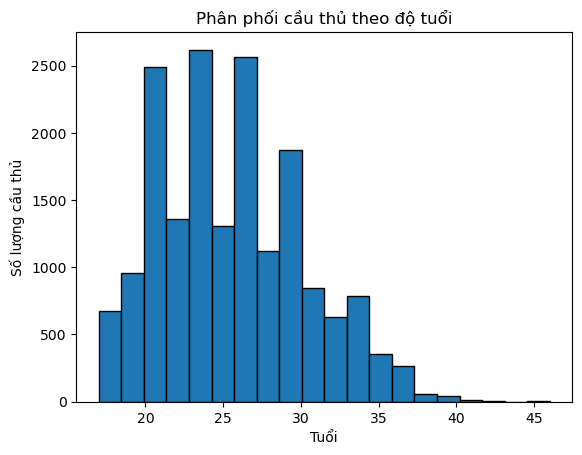

In [57]:
plt.hist(df['age'], bins=20, edgecolor='black')
plt.title('Phân phối cầu thủ theo độ tuổi')
plt.xlabel('Tuổi')
plt.ylabel('Số lượng cầu thủ')
plt.show()

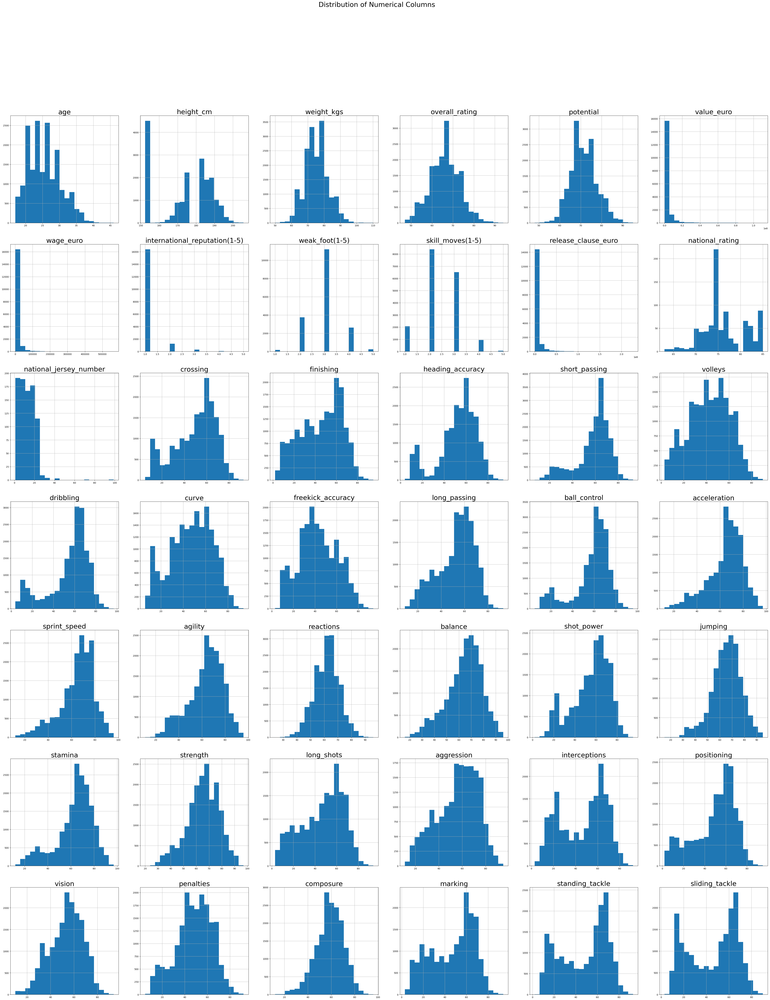

In [58]:


# Tính số dòng cần thiết dựa trên số lượng cột và số cột mong muốn
nrows = len(numerical_columns) // 6 + int(len(numerical_columns) % 6 != 0)

# Tạo biểu đồ histogram cho từng cột số
fig, axes = plt.subplots(nrows=nrows, ncols=6, figsize=(60, nrows * 10))
fig.suptitle("Distribution of Numerical Columns", fontsize=30)  # Đặt tiêu đề cho toàn bộ biểu đồ

# Vòng lặp để vẽ từng biểu đồ histogram
for i, column in enumerate(numerical_columns):
    ax = axes[i // 6, i % 6]
    df[column].hist(ax=ax, bins=20)

    ax.set_title(column, fontsize=30)  # Đặt tiêu đề cho từng biểu đồ

plt.show()

In [59]:
def missing_ratio(x):
    return x.isnull().mean() * 100

# Tạo DataFrame mới chỉ chứa các cột số
numerical_df = df[numerical_columns]

# Áp dụng hàm missing_ratio và tính giá trị tối thiểu và tối đa
result_df = numerical_df.agg([missing_ratio, 'min', 'max'])

# In kết quả
result_df

,age,height_cm,weight_kgs,overall_rating,potential,value_euro,wage_euro,international_reputation(1-5),weak_foot(1-5),skill_moves(1-5),release_clause_euro,national_rating,national_jersey_number,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,freekick_accuracy,long_passing,ball_control,acceleration,sprint_speed,agility,reactions,balance,shot_power,jumping,stamina,strength,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle
missing_ratio,0.0,0.00,0.0,0.0,0.0,1.420296e+00,1.370168,0.0,0.0,0.0,1.023170e+01,95.22669,95.22669,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
min,17.0,152.40,49.9,47.0,48.0,1.000000e+04,1000.000000,1.0,1.0,1.0,1.300000e+04,63.00000,1.00000,5.0,2.0,4.0,7.0,3.0,4.0,6.0,3.0,9.0,5.0,12.0,12.0,11.0,24.0,16.0,2.0,15.0,12.0,20.0,3.0,11.0,3.0,2.0,10.0,5.0,12.0,3.0,2.0,3.0
max,46.0,205.74,110.2,94.0,95.0,1.105000e+08,565000.000000,5.0,5.0,5.0,2.265000e+08,85.00000,99.00000,93.0,95.0,94.0,93.0,90.0,97.0,94.0,94.0,93.0,96.0,97.0,96.0,96.0,96.0,96.0,95.0,95.0,97.0,97.0,94.0,95.0,92.0,95.0,94.0,92.0,96.0,94.0,93.0,90.0


#### Nhận xét
- Ta có thể thấy các giá trị min, max không có gì bất thường
- Tuy nhiên 2 cột `national_rating` và `national_jersey_number` có phần trăm missing khá lớn : 95.22669	 %
- Điều này có thể giải thích là vì một đất nước có số lượng cầu thủ khá nhiều có thể lên tới hàng nghìn, hàng triệu tuy nhiên số cầu thủ được gọi lên đội tuyển quốc gia chỉ là 20-30 cầu thủ nên rất ít cầu thủ trong dữ liệu được gọi lên đội tuyển quốc gia nên 2 cột `national_rating` và `national_jersey_number` được để trống

### Với mỗi cột có kiểu dữ liệu dạng phân loại (categorical), các giá trị được phân bố như thế nào?

#### Có 2 loại dữ liệu phân loại:

- Một câu trả lời: `nationality`, `preferred_foot`, `body_type`, `national_team`, `national_team_position`
- Nhiều câu trả lời : `positions`

#### Tỷ lệ giá trị bị thiếu

In [60]:
# Tạo một DataFrame tạm thời để lưu thông tin tỷ lệ giá trị thiếu
missing_info_df = pd.DataFrame(columns=['Column', 'Missing Percentage'])

# Lặp qua từng cột phân loại
for column in ['nationality', 'preferred_foot', 'body_type', 'national_team', 'national_team_position', 'positions']:
    # Tính tỷ lệ giá trị thiếu
    missing_percentage = df[column].isnull().mean() * 100
    
    # Thêm thông tin vào DataFrame tạm thời
    missing_info_df = pd.concat([missing_info_df, pd.DataFrame({'Column': [column], 'Missing Percentage': [missing_percentage]})], ignore_index=True)

# In DataFrame với thông tin tỷ lệ giá trị thiếu
print("\nTỷ lệ giá trị bị thiếu:")
missing_info_df


Tỷ lệ giá trị bị thiếu:


,Column,Missing Percentage
0,nationality,0.00000
1,preferred_foot,0.00000
2,body_type,0.00000
3,national_team,95.22669
4,national_team_position,95.22669
5,positions,0.00000


**Nhận xét**
- Ta có thể thấy lượng giá trị bị thiếu của `national_team`  và `national_team_position` là rất lớn : 95.22669%
- Điều này cũng cùng nguyên nhân với tỷ lệ bị thiếu ở  2 cột `national_rating` và `national_jersey_number` như trên vì ít cầu thủ được gọi lên đội tuyển quốc gia


#### Phân bố của các cột có một câu trả lời 


Phân phối giá trị của 'nationality':
England        1658
Germany        1199
Spain          1070
France          925
Argentina       904
Brazil          832
Italy           655
Colombia        624
Japan           466
Netherlands     441
Name: nationality, dtype: int64


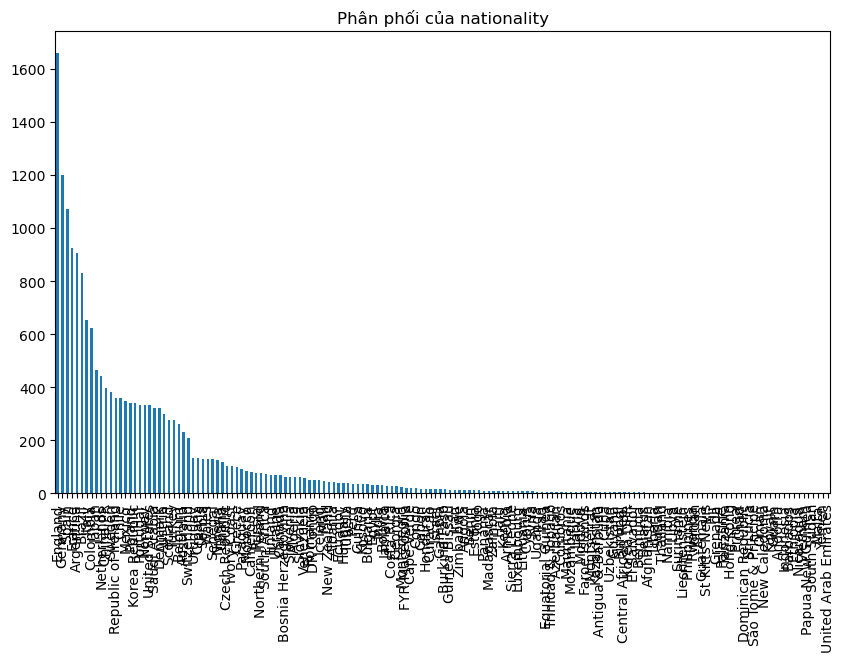


Phân phối giá trị của 'preferred_foot':
Right    13781
Left      4173
Name: preferred_foot, dtype: int64


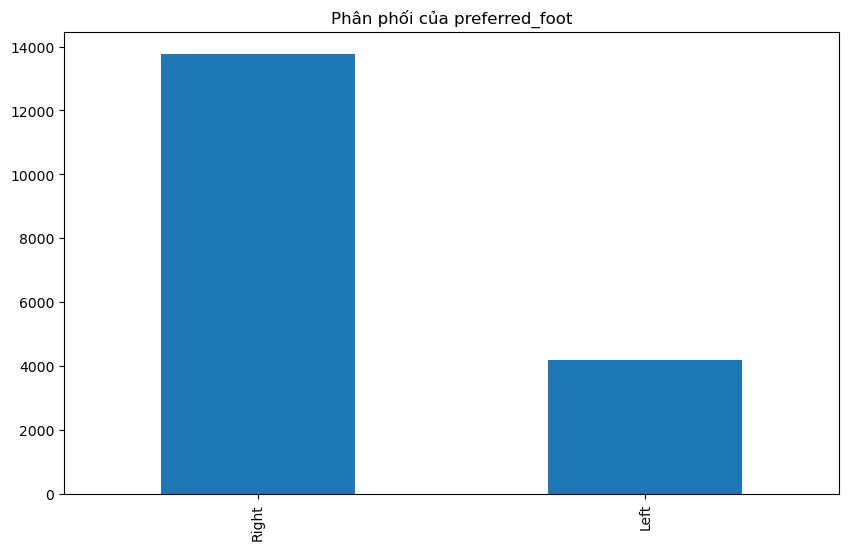


Phân phối giá trị của 'body_type':
Normal                 10393
Lean                    6468
Stocky                  1086
Messi                      1
Courtois                   1
PLAYER_BODY_TYPE_25        1
Akinfenwa                  1
Shaqiri                    1
Neymar                     1
C. Ronaldo                 1
Name: body_type, dtype: int64


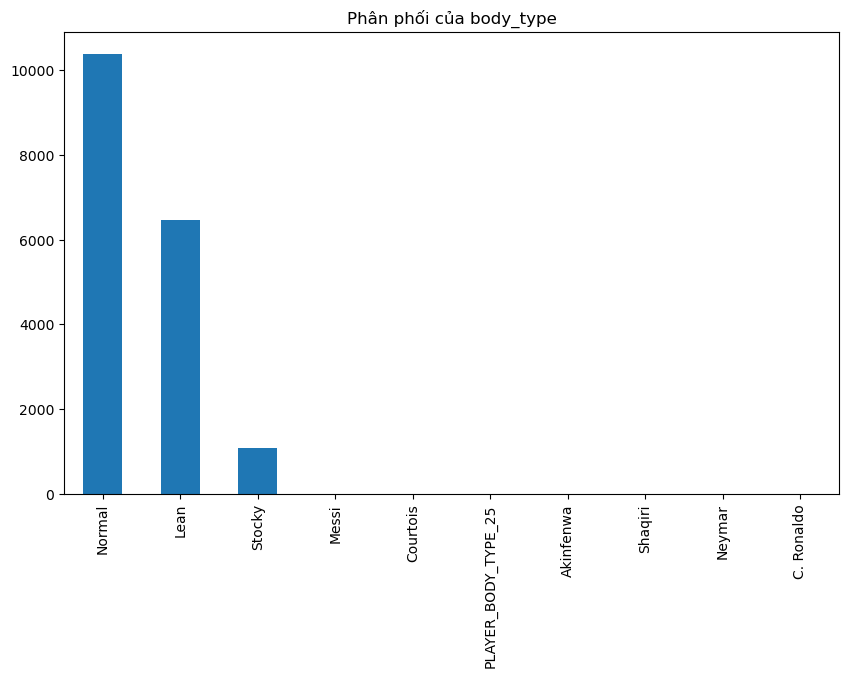


Phân phối giá trị của 'national_team':
Scotland         23
Brazil           23
France           23
Netherlands      23
Germany          23
Spain            23
Denmark          23
England          23
United States    23
Italy            22
Name: national_team, dtype: int64


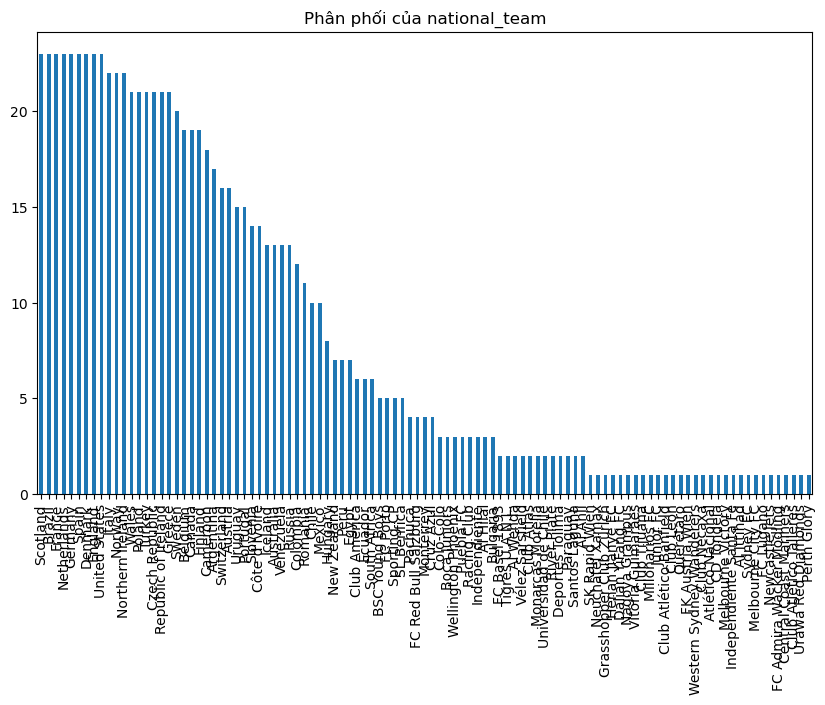


Phân phối giá trị của 'national_team_position':
SUB    389
GK      50
RCB     40
LCB     39
RB      34
LB      33
ST      30
LM      29
LCM     26
RM      26
Name: national_team_position, dtype: int64


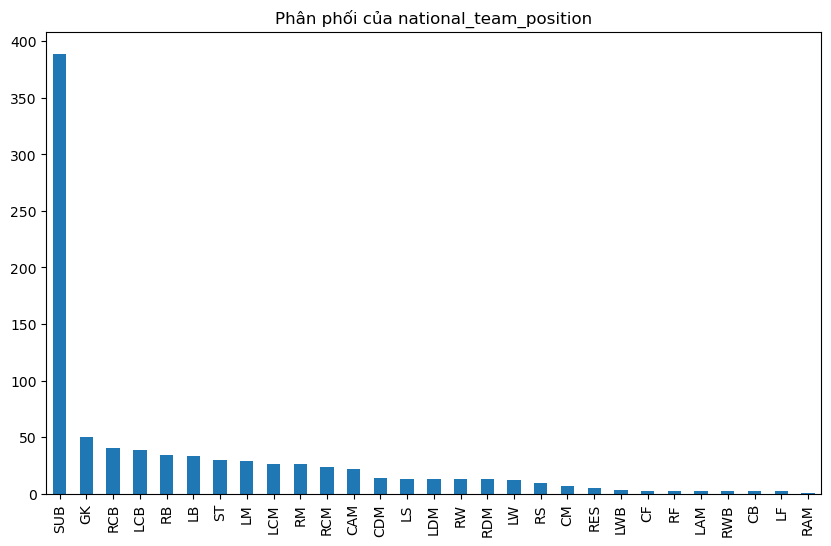

In [61]:
# Lặp qua từng cột phân loại
for column in ['nationality', 'preferred_foot', 'body_type', 'national_team', 'national_team_position']:
    # Phân phối giá trị
    value_counts = df[column].value_counts()
    
    # In phân phối giá trị (hiển thị một số giá trị đầu tiên)
    print(f"\nPhân phối giá trị của '{column}':")
    print(value_counts.head(10))
    
    # Vẽ biểu đồ cột cho phân phối giá trị
    value_counts.plot(kind='bar', figsize=(10, 6), title=f'Phân phối của {column}')
    plt.show()

#### Phân bố của các cột có một câu trả lời

In [62]:
# Tính số lượng từng giá trị trong cột positions
positions_counts = df['positions'].str.split(',').explode().value_counts()

# In số lượng từng giá trị
print("Count of each position:")
print(positions_counts)

Count of each position:
CM     3795
CB     3675
ST     3173
CDM    2699
LM     2521
RM     2452
CAM    2185
GK     2065
RB     2057
LB     2039
LW      957
RW      941
CF      362
RWB     314
LWB     299
Name: positions, dtype: int64


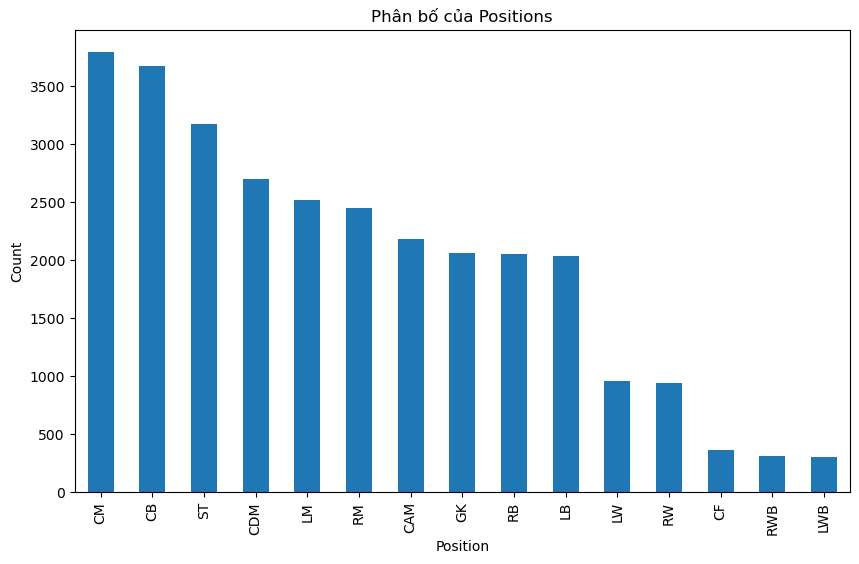

In [63]:
positions_counts.plot(kind='bar', figsize=(10, 6), title='Phân bố của Positions')
plt.xlabel('Position')
plt.ylabel('Count')
plt.show()

**Nhận xét**
- Nhìn chung các giá trị đều hợp lý
- Tuy nhiên , ta thấy ở cột `body_type` có một vài giá trị bất thường : `Messi, Courtois , PLAYER_BODY_TYPE_25, Akinfenwa  , Shaqiri , Neymar  , C.Ronaldo`. Những giá trị này là tên cầu thủ chứ không phải `body_type`.      1

#### Xóa 4 cột bị thiếu nhiều `national_jersey_number`, `national_team_position`, `national_rating`, `national_team`

In [64]:
columns_to_drop = ['national_jersey_number', 'national_team_position', 'national_rating', 'national_team']
df.drop(columns_to_drop, axis=1, inplace=True)


In [65]:
df.head()

,name,full_name,birth_date,age,height_cm,weight_kgs,positions,nationality,overall_rating,potential,value_euro,wage_euro,preferred_foot,international_reputation(1-5),weak_foot(1-5),skill_moves(1-5),body_type,release_clause_euro,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,freekick_accuracy,long_passing,ball_control,acceleration,sprint_speed,agility,reactions,balance,shot_power,jumping,stamina,strength,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle
0,L. Messi,Lionel Andrés Messi Cuccittini,1987-06-24,31,170.18,72.1,"CF,RW,ST",Argentina,94,94,110500000.0,565000.0,Left,5,4,4,Messi,226500000.0,86,95,70,92,86,97,93,94,89,96,91,86,93,95,95,85,68,72,66,94,48,22,94,94,75,96,33,28,26
1,C. Eriksen,Christian Dannemann Eriksen,1992-02-14,27,154.94,76.2,"CAM,RM,CM",Denmark,88,89,69500000.0,205000.0,Right,3,5,4,Lean,133800000.0,88,81,52,91,80,84,86,87,89,91,76,73,80,88,81,84,50,92,58,89,46,56,84,91,67,88,59,57,22
2,P. Pogba,Paul Pogba,1993-03-15,25,190.50,83.9,"CM,CAM",France,88,91,73000000.0,255000.0,Right,4,4,5,Normal,144200000.0,80,75,75,86,85,87,85,82,90,90,71,79,76,82,66,90,83,88,87,82,78,64,82,88,82,87,63,67,67
3,L. Insigne,Lorenzo Insigne,1991-06-04,27,162.56,59.0,"LW,ST",Italy,88,88,62000000.0,165000.0,Right,3,4,4,Normal,105400000.0,86,77,56,85,74,90,87,77,78,93,94,86,94,83,93,75,53,75,44,84,34,26,83,87,61,83,51,24,22
4,K. Koulibaly,Kalidou Koulibaly,1991-06-20,27,187.96,88.9,CB,Senegal,88,91,60000000.0,135000.0,Right,3,3,2,Normal,106500000.0,30,22,83,68,14,69,28,28,60,63,70,75,50,82,40,55,81,75,94,15,87,88,24,49,33,80,91,88,87


## 4. Đặt câu hỏi

### Câu hỏi 1: Sự khác biệt về vị trí chơi giữa các cầu thủ thuận chân trái và các cầu thủ thuận chân phải ?

### Ý nghĩa:
- So sánh tỉ lệ các cầu thủ thuận chân trái và chân phải ở mỗi vị trí
- Xác định các cầu thủ thuận chân trái , các cầu thủ thuận chân phải thường thi đấu ở vị trí nào
- Định hướng cho các tài năng trẻ, cầu thủ nhí về vị trí thi đấu thuận lợi dựa theo chân thuận


In [66]:
# Tạo một bản sao của df để không làm thay đổi dữ liệu gốc
new_df = df.copy()

# Chuyển đổi cột 'positions' thành danh sách các vị trí
new_df['positions'] = new_df['positions'].str.split(',')

# Chuyển đổi dữ liệu thành dạng dài
new_df_long = new_df.explode('positions')

# Thống kê số lượng cầu thủ thuận chân trái và chân phải ở từng vị trí
position_counts = new_df_long.groupby(['positions', 'preferred_foot']).size().unstack(fill_value=0)

# In kết quả
position_counts

preferred_foot,Left,Right
positions,,
CAM,580,1605
CB,802,2873
CDM,405,2294
CF,68,294
CM,695,3100
GK,213,1852
LB,1561,478
LM,1033,1488
LW,280,677


Vẽ biểu đồ trực quan kết quả

<Figure size 1000x600 with 0 Axes>

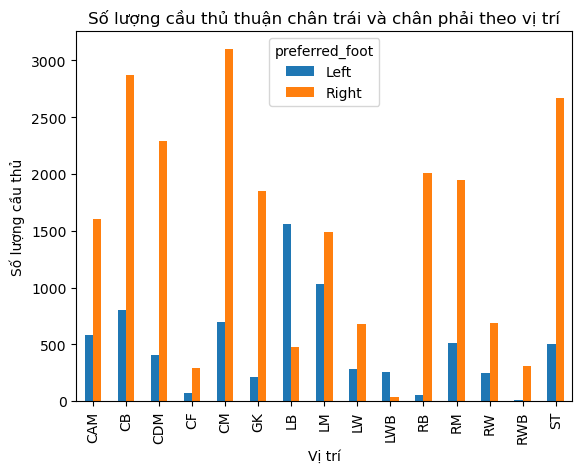

In [67]:
# Vẽ biểu đồ
plt.figure(figsize=(10, 6))
position_counts.plot(kind='bar', stacked=False)
plt.xlabel('Vị trí')
plt.ylabel('Số lượng cầu thủ')
plt.title('Số lượng cầu thủ thuận chân trái và chân phải theo vị trí')
plt.show()

### Câu hỏi 2: Kỹ năng của các cầu thủ sẽ ra sao ở trong các giai đoạn của sự nghiệp ?

### Ý nghĩa: 
Tìm hiểu sự thay đổi của các kỹ năng theo thời gian trong sự nghiệp của cầu thủ ở các vị trí khác nhau.

Tổng quan các cột dữ liệu được sử dụng cho câu hỏi này: 

- Sẽ dựa vào vị trí chơi chính của cầu thủ.
- Sẽ chia độ tuổi sự nghiệp ra thành 3 giai đoạn: early (17-23 tuổi), mid (24-29 tuổi), late (từ 30 tuổi trở lên)
- Các cột kỹ năng sẽ xét: skill_moves, dribbling, ball_control, agility, reactions, vision, composure, strength.    

### Kiểm tra các cột dữ liệu có chứa giá trị null hay không ?

In [68]:
df.isnull().any()

name                             False
full_name                        False
birth_date                       False
age                              False
height_cm                        False
weight_kgs                       False
positions                        False
nationality                      False
overall_rating                   False
potential                        False
value_euro                        True
wage_euro                         True
preferred_foot                   False
international_reputation(1-5)    False
weak_foot(1-5)                   False
skill_moves(1-5)                 False
body_type                        False
release_clause_euro               True
crossing                         False
finishing                        False
heading_accuracy                 False
short_passing                    False
volleys                          False
dribbling                        False
curve                            False
freekick_accuracy        

### Chia ra thành ba dataframe dựa trên độ tuổi trong sự nghiệp

- Early: 17-23
- Mid: 24-29
- Late: > 30

In [69]:
# The skills that would be computed
skills = [
    'skill_moves(1-5)', 'dribbling', 'ball_control', 'agility', 'reactions', 'vision', 'composure', 'strength',
    'finishing', 'positioning', 'short_passing', 'long_passing', 'curve',
    'heading_accuracy', 'marking', 'acceleration', 'crossing', 'finishing'
]

# Divide into three dataframe based on age bin
df_early = df[(df['age'] >= 17) & (df['age'] < 24)]
df_mid = df[(df['age'] >= 24) & (df['age'] < 30)]
df_late = df[df['age'] >= 30]

# Create a primary_position column in df which stores the primary position of the player
def filter_for_primary_position(my_df):
    if ('primary_position' in my_df.columns): return
    my_df['primary_position'] = my_df['positions'].apply(lambda x: x.split(",")[0])

filter_for_primary_position(df_early)
filter_for_primary_position(df_mid)
filter_for_primary_position(df_late)


# Compute the average rating value for each column
df_early_avg = df_early.groupby('primary_position')[skills].mean()
df_mid_avg = df_mid.groupby('primary_position')[skills].mean()
df_late_avg = df_late.groupby('primary_position')[skills].mean()

/tmp/ipykernel_757/735456816.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_757/735456816.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_757/735456816.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Vẽ biểu đồ star chart cho từng (vị trí chơi, giai đoạn sự nghiệp)

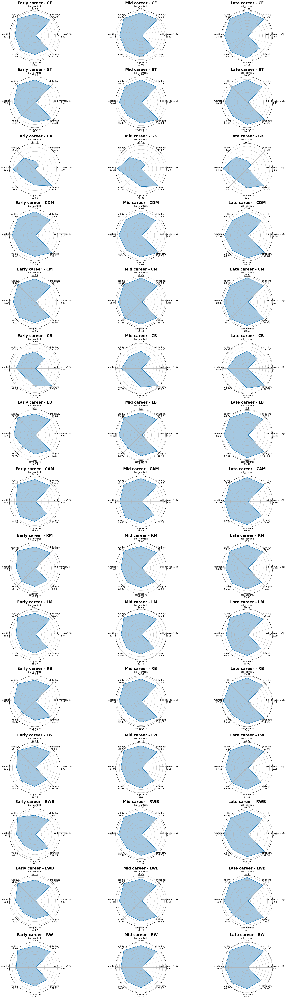

In [70]:
# The skills that would be considered in our analysis
general_skills = ['skill_moves(1-5)', 'dribbling', 'ball_control', 'agility', 'reactions', 'vision', 'composure', 'strength']

# Career phase
career_phase = ['Early', 'Mid', 'Late']

fig, axes = plt.subplots(15, 3, figsize = (25, 75), subplot_kw = dict(polar = True))

# Plot star graph for each (position, career_phase)
def plot_star_graph(ax, values, labels, title):
    num_vars = len(labels)
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
    
    angles = list(angles)
    values = list(values)
    angles.append(angles[0])
    values.append(values[0])

    ax.plot(angles, values, linewidth = 2, linestyle = 'solid', label = title)
    ax.fill(angles, values, alpha = 0.4)

    labels = [f'{label}:\n{round(value, 2)}' for label, value in zip(labels, values)]
    
    ax.set_yticklabels([])
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels, fontsize = 12)

    ax.set_title(title, fontsize = 20, fontweight = 'bold')

# Store all available positions in a football team into positions list
positions = df_late['primary_position'].unique()

dfs = [df_early, df_mid, df_late]
df_avgs = [df_early_avg, df_mid_avg, df_late_avg]

for i, position in enumerate(positions):
    for j, df_avg in enumerate(df_avgs):
        ax = axes[i, j]

        # Get the columns necessary for analysis, transpose it
        df_avg = df_avg[general_skills]
        df_avg = df_avg.T
        
        values = df_avg.loc[:, position].values
        
        labels = general_skills
        plot_star_graph(ax, values, labels, f"{career_phase[j]} career - {position}")

plt.tight_layout()
plt.show()

- Ở giai đoạn từ Early đến Mid, tất cả chỉ số đều phát triển ở mỗi vị trí
- Ở giai đoạn từ Mid đến Late, các chỉ số có dấu hiệu chững lại, một vài chỉ số bị giảm và cá biệt một vài chỉ số vẫn tăng.
- Ta thấy rằng biểu đồ radar chart phát triển mạnh nhất ở giai đoạn từ Early -> Mid với việc nhiều góc được mở ra thấy rõ, giai đoạn Mid -> Late chậm đi đáng kể và có sự giảm nhẹ chỉ số ở 1 vài vị trí.

Để tìm hiểu kỹ hơn các chỉ số nào thay đổi như thế nào, những kỹ năng nào được đồng phát triển nhất ở các vị trí. Ta sẽ tiếp tục tìm hiểu dưới đây.

Ta sẽ tạo ra 2 df thể hiện chênh lệch giữa (Mid - Early) và (Late - Mid).

In [71]:
# Get difference in skills for comparison
df_diff_early_mid = df_mid_avg[general_skills] - df_early_avg[general_skills]
df_diff_mid_late = df_late_avg[general_skills] - df_mid_avg[general_skills]

# Standardize skill_moves(1-5) to scale 100
df_diff_early_mid['skill_moves(1-5)'] = df_diff_early_mid['skill_moves(1-5)'] * 20
df_diff_mid_late['skill_moves(1-5)'] = df_diff_mid_late['skill_moves(1-5)'] * 20

# Rename, remove '(1-5)'
df_diff_early_mid.rename(columns = {'skill_moves(1-5)': 'skill_moves'}, inplace = True)
df_diff_mid_late.rename(columns = {'skill_moves(1-5)': 'skill_moves'}, inplace = True)

general_skills = ['skill_moves', 'dribbling', 'ball_control', 'agility', 'reactions', 'vision', 'composure', 'strength']



Ta sẽ tạo ra max_list và min_list, mỗi list sẽ gồm 2 list con tương ứng với df_diff_early_mid và df_diff_mid_late. Mỗi giá trị trong list con sẽ tương ứng với vị trí chơi và [skill đạt giá trị max/min, giá trị max/min]

In [72]:
max_list = [[], []]
min_list = [[], []]

# For each position, calculate the skill that got the max/min improvement in rating score
def get_prominent_skills_in_career_span(curr_df, i): 
    curr_df = curr_df.T

    for column in curr_df.columns:
        max_element = curr_df[column].nlargest(1)
        min_element = curr_df[column].nsmallest(1)
        
        max_list[i].append([max_element.index.values[0], max_element.values[0]])
        min_list[i].append([min_element.index.values[0], min_element.values[0]])

get_prominent_skills_in_career_span(df_diff_early_mid, 0)
get_prominent_skills_in_career_span(df_diff_mid_late, 1)
    

Ta sẽ tiến hành trực quan hoá để tìm ra kỹ năng có sự thay đổi lớn nhất và ít nhất (hoặc thụt lùi) ở mỗi vị trí chơi.

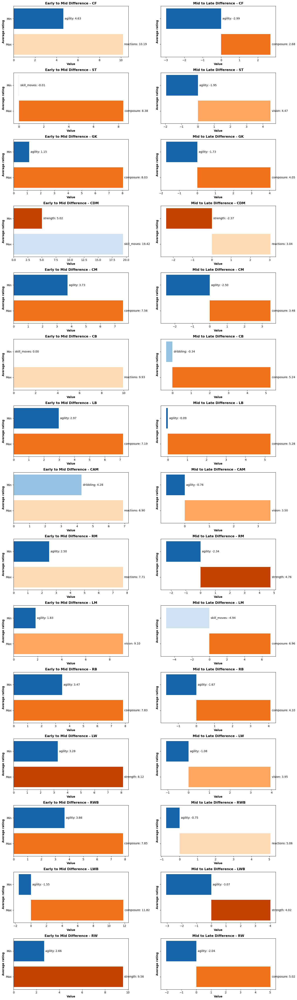

In [73]:
cold_colors = sns.color_palette("Blues", n_colors = 4)
hot_colors = sns.color_palette("Oranges", n_colors = 4)

colors = cold_colors + hot_colors
fig, axes = plt.subplots(15, 2, figsize = (15, 50), sharey = True)

career_phase = ['Early to Mid Difference', 'Mid to Late Difference']

# Plot bar chart that represent the max/min improvement in rating score
for i, position in enumerate(positions):
    for j in range(2):
        # Extract data for max and min values for the current position and career phase
        max_data = max_list[j][i]
        min_data = min_list[j][i]

        # Plot horizontal bar chart for max and min values with specified colors
        axes[i, j].barh(['Max', 'Min'], [max_data[1], min_data[1]], color = [colors[general_skills.index(max_data[0])], colors[general_skills.index(min_data[0])]])

        # Annotate the skill names and values on the right of the bars for max and min
        axes[i, j].annotate(f'{max_data[0]}: {max_data[1]:.2f}', 
                            xy = (max_data[1], 0),
                            xytext = (5, 5),
                            textcoords = 'offset points',
                            color = 'black', ha = 'left', va = 'top')

        axes[i, j].annotate(f'{min_data[0]}: {min_data[1]:.2f}', 
                            xy = (max(0, min_data[1]), 1),
                            xytext = (5, 5),
                            textcoords = 'offset points',
                            color = 'black', ha = 'left', va = 'top')

        # Set labels and title for the current subplot
        axes[i, j].set_xlabel('Value', fontweight = 'bold')
        axes[i, j].set_ylabel('Average rating', fontweight = 'bold')
        axes[i, j].set_title(f'{career_phase[j]} - {position}', fontweight = 'bold')



plt.tight_layout(w_pad = 2)
plt.show()


In [74]:
# Calculate the number of times a skill is presented as the max/min improved skill for each position, select top 1 only.
def number_of_improved_skills(i, my_list):
    counted_elements = Counter(item[0] for item in my_list[i] if item[1] > 0)
    sort_counted = counted_elements.most_common(1)
    
    for curr_skill in sort_counted: 
        position_with_this_skill = []

        # Retrieve more info about which position possess 'curr_skill' as the max/min improvement for that position.
        for idx, position in enumerate(positions):
            if (my_list[i][idx][0] == curr_skill[0]): 
                position_with_this_skill.append(position)

        print(f'Skill: {curr_skill[0]} - Count: {curr_skill[1]}\nPosition: {position_with_this_skill}\n')


# We will print the skill that got the max/min number of occurences, with a list of position correspond to that skill as well.
print("Early-Mid transition")
print("Max:")
number_of_improved_skills(0, max_list)
print("\nMin:")
number_of_improved_skills(0, min_list)

print('-----------------------------------------')
print("\nMid-Late transition")
print("Max:")
number_of_improved_skills(1, max_list)
print("\nMin:")
number_of_improved_skills(0, min_list)


Early-Mid transition
Max:
Skill: composure - Count: 7
Position: ['ST', 'GK', 'CM', 'LB', 'RB', 'RWB', 'LWB']


Min:
Skill: agility - Count: 10
Position: ['CF', 'GK', 'CM', 'LB', 'RM', 'LM', 'RB', 'LW', 'RWB', 'LWB', 'RW']

-----------------------------------------

Mid-Late transition
Max:
Skill: composure - Count: 8
Position: ['CF', 'GK', 'CM', 'CB', 'LB', 'LM', 'RB', 'RW']


Min:
Skill: agility - Count: 10
Position: ['CF', 'GK', 'CM', 'LB', 'RM', 'LM', 'RB', 'LW', 'RWB', 'LWB', 'RW']



Tiếp theo ta sẽ coi skill nào được cải thiện nhiều nhất

/tmp/ipykernel_757/79013094.py:22: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_757/79013094.py:22: UserWarning:

FixedFormatter should only be used together with FixedLocator



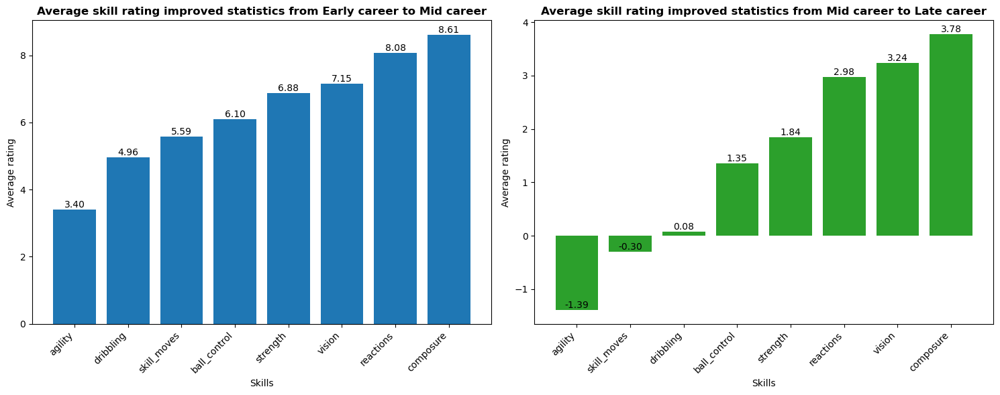

In [75]:
def plot_bar_chart(curr_df, ax, title, color='C0'):
    data = curr_df.mean()
    bar_data = []

    # Put into bar_data to sort from smallest value to largest value, put the 'val' first for default sort
    for skill, val in zip(curr_df.columns, data):
        bar_data.append([val, skill])
    
    bar_data = sorted(bar_data)
    
    x = [val[1] for val in bar_data]
    y = [val[0] for val in bar_data]

    bars = ax.bar(x, y, color = color)

    # Set labels and title for the subplot
    ax.set_xlabel('Skills')
    ax.set_ylabel('Average rating')
    ax.set_title(f'Average skill rating improved statistics from {title[0]} career to {title[1]} career', fontweight='bold')

    # Rotate x-axis labels for better visibility
    ax.set_xticklabels(x, rotation = 45, ha = 'right')

    # Add text annotations on top of each bar
    for bar, value in zip(bars, y):
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f'{value:.2f}', ha = 'center', va = 'bottom', color = 'black')


fig, ax = plt.subplots(1, 2, figsize=(15, 6))

# Plot bar chart for both career span comparison
plot_bar_chart(df_diff_early_mid, ax[0], ['Early', 'Mid'])
plot_bar_chart(df_diff_mid_late, ax[1], ['Mid', 'Late'], color = 'C2')

plt.tight_layout()
plt.show()


Early-Mid: ta có thể thấy chỉ duy nhất chỉ số <b>agility(LWB)</b> và <b>skill_moves (GK)</b> bị thụt lùi hoặc ko đổi. Còn lại tất cả kỹ năng đều tăng khá mạnh, ở mục chỉ số tăng cao nhất, chỉ số bình tĩnh (composure) được ghi nhận tăng nhiều nhất ở 7 vị trí, với giá trị tăng trung bình là 8.08.

Mid-Late: cho thấy composure vẫn là kỹ năng tăng nhiều nhất ở các vị trí (8) mặc dù tỉ lệ không cao như trước (3.24).

Kết luận cho thấy bình tĩnh (composure) là kỹ năng có tỷ lệ phát triển cao nhất cả trong trong cả 2 giai đoạn so sánh, điều này chứng tỏ khả năng bình tĩnh là một yếu tố quan trọng và lâu dài trong quá trình phát triển kỹ năng của cầu thủ ở nhiều vị trí khác nhau, và nó không phụ thuộc vào độ tuổi hay vị trí thi đấu. Cầu thủ nâng cao khả năng bình tĩnh của mình có khả năng thể hiện tốt hơn, sự kiên nhẫn trong những tình huống áp lực và tăng cường hiệu suất của đội trên sân. Hiểu rõ hơn về sự quan trọng về lâu dài của khả năng bình tĩnh (composure) có thể giúp đưa ra một chương trình phát triển và huấn luyện chiến thuật cầu thủ ở nhiều độ tuổi và vị trí, nhấn mạnh vai trò của nó trong việc tối ưu hóa hiệu suất và sự bền vững trong sự nghiệp của một cầu thủ.

Agility là kỹ năng cải thiện ít nhất ở giai đoạn Early-Mid (3.4) và suy giảm nhiều nhất ở giai đoạn Mid-Late (-1.39). Agility cũng là kỹ năng cải thiện ít nhất ở rất nhiều vị trí ở cả 2 giai đoạn, Early-Mid: 10 và Mid-Late: 10. 

Điều này cho thấy agility không phải là một trong những yếu tố được tập trung phát triển trong giai đoạn trung ương của sự nghiệp cầu thủ và có thể trở nên ít quan trọng hơn khi cầu thủ vào giai đoạn cuối sự nghiệp. Trong cả hai giai đoạn, agility được xác định là kỹ năng ít phát triển ở rất nhiều vị trí, bao gồm CF, GK, CM, LB, RM, LM, RB, LW, RWB, LWB, RW. Điều này có thể ám chỉ rằng agility không phải là một yếu tố chính được tập trung đào tạo trong những giai đoạn quan trọng này và có thể ít quyết định đến sự phát triển của cầu thủ ở những vị trí này.
Mặc dù agility đóng vai trò quan trọng trong nhiều hoạt động bóng đá, nhưng có thể có các yếu tố khác như chiến thuật đội hình, phong cách chơi, hoặc sự thay đổi trong vai trò của cầu thủ, đóng góp đến việc giảm độ quan trọng của agility trong giai đoạn trung ương và cuối sự nghiệp của cầu thủ.

### Câu hỏi 3: Các thông số khác ảnh hưởng đến giá trị cầu thủ như thế nào ?

### Ý nghĩa:
Trả lời câu hỏi này là để hiểu rõ hơn về các yếu tố quyết định giá trị của một cầu thủ trong bối cảnh bóng đá. Nó có thể giúp đánh giá và so sánh giữa các cầu thủ, đồng thời cung cấp thông tin để đưa ra quyết định về việc mua bán cầu thủ, xếp đội hình, hoặc đánh giá hiệu suất của đội bóng.*

#### Chia dữ liệu thành 2 loại để dễ xem xét là Category và Numeric.

Đầu tiên xét các dữ liệu thuộc loại Category

In [76]:
df_copy = df.copy()
df_copy.isna().sum().sort_values(ascending = False)

release_clause_euro              1837
value_euro                        255
wage_euro                         246
name                                0
stamina                             0
ball_control                        0
acceleration                        0
sprint_speed                        0
agility                             0
reactions                           0
balance                             0
shot_power                          0
jumping                             0
long_shots                          0
strength                            0
freekick_accuracy                   0
aggression                          0
interceptions                       0
positioning                         0
vision                              0
penalties                           0
composure                           0
marking                             0
standing_tackle                     0
long_passing                        0
dribbling                           0
curve       

In [77]:
#Xử lý các dữ liệu bị thiếu
moda_clause = df_copy['release_clause_euro'].mode()[0]
moda_value = df_copy['value_euro'].mode()[0]
moda_wage = df_copy['wage_euro'].mode()[0]

df_copy['release_clause_euro'].fillna(moda_clause, inplace=True)
df_copy['value_euro'].fillna(moda_value, inplace=True)
df_copy['wage_euro'].fillna(moda_wage, inplace=True)

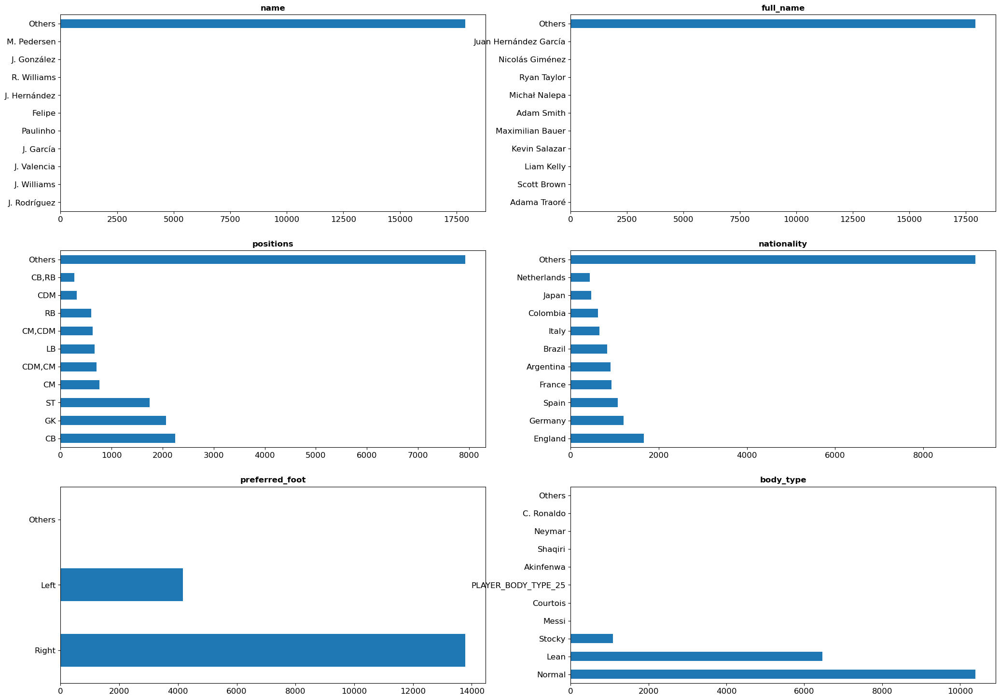

In [78]:

def plot_categorical_eda(cat):
    rows = ceil(cat.shape[1] / 2)
    f, ax = plt.subplots(nrows=rows, ncols=2, figsize=(25, rows * 6))
    ax = ax.flat 
    for idx, variable in enumerate(cat):
        # Giới hạn danh mục trong top 10 để dễ xem xét và phần còn lại được xếp vào 'Other'
        top_categories = cat[variable].value_counts().head(10)
        top_categories.loc['Others'] = cat[variable].value_counts().iloc[10:].sum()
        top_categories.plot.barh(ax=ax[idx])
        ax[idx].set_title(variable, fontsize=12, fontweight="bold")
        ax[idx].tick_params(labelsize=12)

plot_categorical_eda(df_copy.select_dtypes('O'))

Nhận xét: các cột name, full_name, birth_date, body_type không đem lại nhiều thông tin hữu ích nên cần lọc bớt

In [79]:
df_copy.drop(['name' , 'full_name' , 'birth_date' ,'preferred_foot', 'body_type'], axis = 1, inplace = True)

Tiếp theo để xem xét giá trị của cầu thủ thì lấy trung bình cộng các cột liên quan đến tiền , cụ thể là giá trị cầu thủ thể hiện qua Giá trị chuyển nhượng(value_euro), Lương tính theo tuần(wage_euro) và Điều khoản giải phóng hợp đồng(release_clause_euro)

In [80]:
df_copy["value"] = (df_copy["release_clause_euro"] + df_copy["value_euro"] + df_copy["wage_euro"])/3

Vì age cũng là thông tin cá nhân của cầu thủ nên có thể vẽ biểu đồ chung với các cột thuộc loại oject để xem xét các yếu tố này đối với giá trị cầu thủ như thế nào

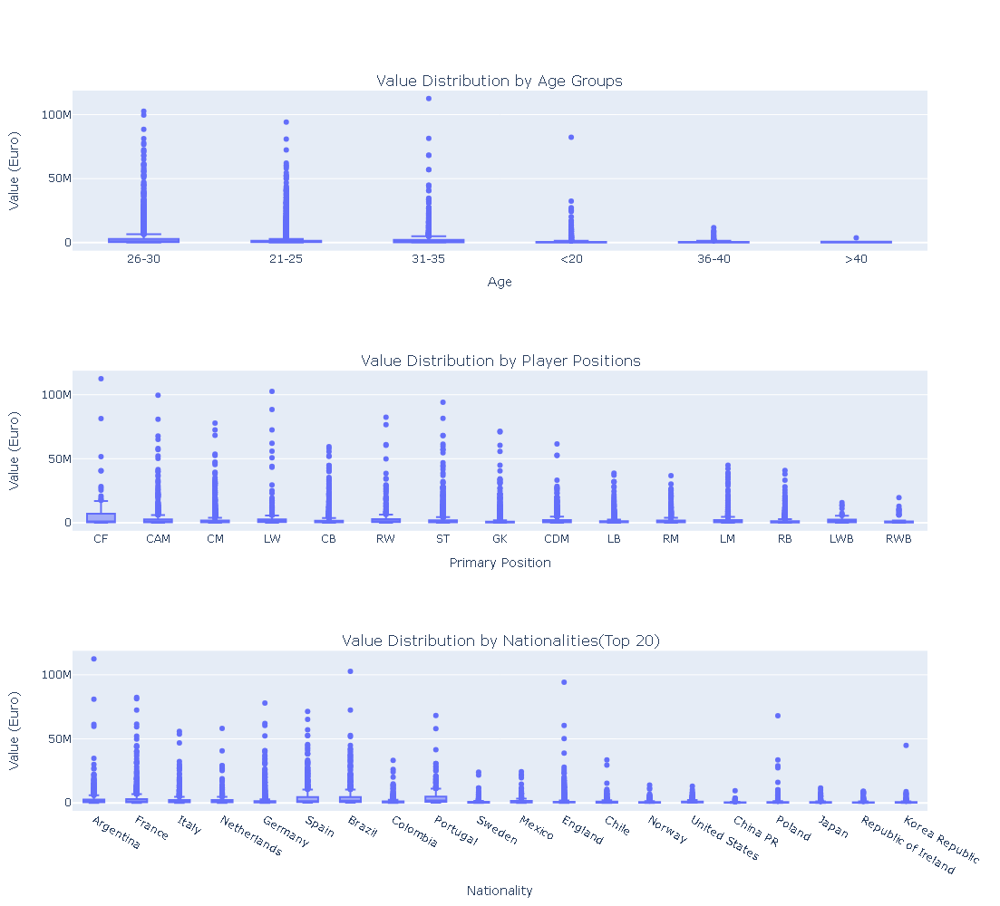

In [81]:

fig = make_subplots(rows=3, cols=1, subplot_titles=['Value Distribution by Age Groups', 
                                                   'Value Distribution by Player Positions',
                                                   'Value Distribution by Nationalities(Top 20)'])

# Biểu đồ thứ nhất: Value Distribution by Age Groups
df_copy['Age'] = pd.cut(df_copy['age'], bins=[0, 20, 25, 30, 35, 40, 100], labels=['<20', '21-25', '26-30', '31-35', '36-40', '>40'])
fig.add_trace(px.box(df_copy, x='Age', y='value').update_traces(quartilemethod="exclusive").data[0], row=1, col=1)
fig.update_xaxes(title_text='Age', row=1, col=1)
fig.update_yaxes(title_text='Value (Euro)', row=1, col=1)
fig.update_layout(xaxis={'categoryorder':'total descending'}, showlegend=False)


# Biểu đồ thứ hai: Value Distribution by Primary Player Positions
df_copy['Position'] = df_copy['positions'].str.split(',').str[0]
fig.add_trace(px.box(df_copy, x='Position', y='value').update_traces(quartilemethod="exclusive").data[0], row=2, col=1)
fig.update_xaxes(title_text='Primary Position', row=2, col=1)
fig.update_yaxes(title_text='Value (Euro)', row=2, col=1)
fig.update_layout(xaxis={'categoryorder':'total descending'}, showlegend=False)

# Biểu đồ thứ ba: Top 20 Nationalities Distribution
# Thêm cột primary_nationality
df_copy['Nationality'] = df_copy['nationality'].str.split(',').str[0]
top_nationalities = df_copy['Nationality'].value_counts().nlargest(20).index.tolist()
df_filtered = df_copy[df_copy['Nationality'].isin(top_nationalities)]
fig.add_trace(px.box(df_filtered, x='Nationality', y='value').update_traces(quartilemethod="exclusive").data[0], row=3, col=1)
fig.update_xaxes(title_text='Nationality', row=3, col=1)
fig.update_yaxes(title_text='Value (Euro)', row=3, col=1)
fig.update_layout(xaxis={'categoryorder':'total descending'}, showlegend=False)

# Cập nhật tựa đề chung cho hình vẽ
fig.update_layout(height=1000)

# Hiển thị hình vẽ
fig.show()


Nhận xét: 
- Dựa vào biểu đồ Value Distribution by Age Groups có thể nhận thấy các cầu thủ ở độ tuổi từ 21 đến 35 là nhóm cầu thủ có giá trị cao vì thường thì cầu thủ có xu hướng phát triển kỹ năng và kinh nghiệm của họ theo thời gian.Nnhững cầu trẻ có thể có tiềm năng và tiếp thu nhanh, nhưng thường cần thời gian để phát triển. Ngược lại, những cầu thủ già hơn có thể có kỹ năng và kinh nghiệm đã được chứng minh, nhưng có thể bị ảnh hưởng bởi việc giảm tốc độ và khả năng thể lực.

- Dựa vào biểu đồ Value Distribution by Player Positions có thể thấy các cầu thủ chơi ở vị trí tiền đạo và tiền vệ có giá trị cao hơn các vị trí còn lại vì thường những cầu thủ có khả năng ghi bàn tốt sẽ được đánh giá cao hơn các vị trí còn lại khi làm tốt nhiệm vụ của họ , mà các vị trí tiền đạo và tiền vệ thường là những vị trí ghi bàn chủ lực của đội bóng

- Dựa vào biểu đồ 'Value Distribution by Nationalities có thể thấy các cầu thủ có xuất thân từ các quốc gia có lịch sử bóng đá lâu đời và đội tuyển quốc gia mạnh mẽ thì giá trị của họ cũng tăng lên 


#### Tiếp theo xét đến các cột thuộc loại numeric.

Vì các cột thuộc loại này thì có thể dễ dàng hiểu được là số càng lớn thì giá trị càng cao nên với loại này ta sẽ xem xét sự ảnh hưởng của nó đến giá trị của cầu thủ ít hay nhiều. Nhưng vì số cột khá nhiều nên ta sẽ gom nhóm các cột dữ liệu lại để dễ xử lý

In [82]:
df_copy['fifa_points'] = (df_copy["overall_rating"] + df_copy["potential"])/2

df_copy['evaluate'] = (df_copy["international_reputation(1-5)"] + df_copy["weak_foot(1-5)"] + df_copy["skill_moves(1-5)"])/3

df_copy['physical'] = (df_copy["strength"] + df_copy["sprint_speed"] + df_copy["agility"] + df_copy["reactions"] + df_copy["stamina"] +
                   df_copy["jumping"] + df_copy["balance"] + df_copy["acceleration"])/8

df_copy['defensive_skills'] = (df_copy["sliding_tackle"] + df_copy["standing_tackle"] + df_copy["interceptions"] + df_copy["marking"] +
                          df_copy["positioning"] + df_copy["aggression"])/6

df_copy['football_skills'] = (df_copy["ball_control"] + df_copy["short_passing"] + df_copy["long_passing"] + df_copy["composure"] +
                          df_copy["vision"] + df_copy["dribbling"])/6

df_copy['offensive_skills'] = (df_copy["crossing"] + df_copy["finishing"] + df_copy["long_shots"] + df_copy["volleys"] +
                           df_copy["heading_accuracy"])/5


Tiếp theo sử dụng mô hình máy học để dự đoán sự ảnh hưởng của các thuộc tính mới

In [83]:

features = ['fifa_points','evaluate','physical', 'defensive_skills', 'football_skills', 'offensive_skills']
target = 'value'

X = df_copy[features]
y = df_copy[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

models = {
    "Linear Regression": LinearRegression(),
    "Gradient Boosting": GradientBoostingRegressor(random_state=42),
    "Support Vector Regression": SVR()
}

results = {}
for name, model in models.items():
    # Huấn luyện mô hình trên một mục tiêu tại một thời điểm
    model.fit(X_train, y_train)

    # Đưa ra dự đoán trên tập kiểm tra
    y_pred = model.predict(X_test)

    #Đánh giá mô hình
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    r2 = r2_score(y_test, y_pred)
    results[name] = {'RMSE': rmse, 'R²': r2}

print(f"Results for {target}:")
for model_name, metrics in results.items():
    print(f"  {model_name}: RMSE - {metrics['RMSE']}, R² - {metrics['R²']}")


Results for value:
  Linear Regression: RMSE - 4495349.995304619, R² - 0.42570982063249485
  Gradient Boosting: RMSE - 1645730.356714598, R² - 0.9230299569910427
  Support Vector Regression: RMSE - 6164435.068092103, R² - -0.07991838239462701


Dựa vào kết quả RMSE và R², mô hình Gradient Boosting cho thấy hiệu suất tốt nhất trong việc dự đoán giá trị ('value').

RMSE (Root Mean Squared Error) là một phép đo đánh giá sai số trung bình giữa giá trị dự đoán và giá trị thực tế. Giá trị RMSE càng nhỏ, mô hình càng chính xác. Trong trường hợp này, mô hình Gradient Boosting có RMSE thấp nhất, chỉ khoảng 1,645,730.36.

R² (R-squared) là một phép đo đánh giá khả năng giải thích biến độc lập của mô hình trên biến phụ thuộc. Giá trị R² càng gần 1, mô hình càng tốt. Mô hình Gradient Boosting cho thấy giá trị R² cao nhất, khoảng 0.923, cho thấy mô hình có khả năng giải thích tốt hơn 92% sự biến động của dữ liệu.


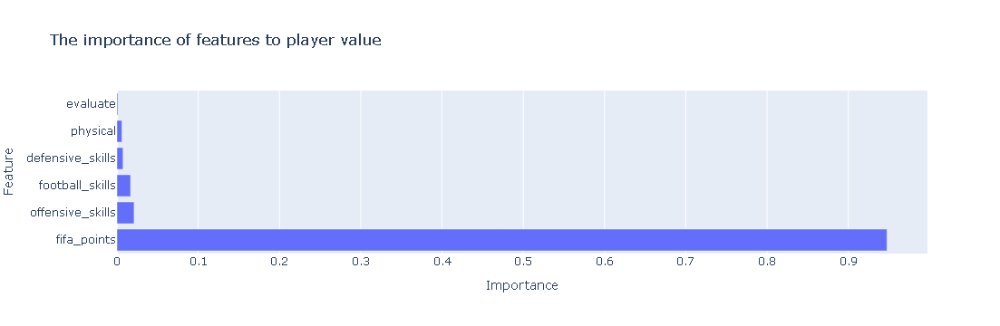

In [84]:
# Gradient Boosting model
gb_model = GradientBoostingRegressor(random_state=42)
gb_model.fit(X_train, y_train) 

# Trích xuất feature importances
importances = gb_model.feature_importances_
importance_df = pd.DataFrame({'Feature': features, 'Importance': importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

fig_importance = px.bar(importance_df, x='Importance', y='Feature', title='The importance of features to player value')
fig_importance.show()

Nhận xét : Dựa vào biểu đồ có thể thấy là điểm đánh giá của fifa có tầm ảnh hưởng đến gía trị của cầu thủ vượt trội hơn hẳn các thông số còn lại vì FIFA là tổ chức quản lý bóng đá hàng đầu thế giới và điểm đánh giá của FIFA được coi là một tiêu chuẩn đánh giá chất lượng và năng lực của cầu thủ. Điểm đánh giá FIFA thường phản ánh các khả năng tấn công, phòng ngự, kỹ thuật, tốc độ và thể lực nên nó đã bao gồm các thông số khác của cầu thủ.

### Câu hỏi 4: Điểm đánh giá của FIFA có chính xác không ?

### Ý nghĩa : 
Dựa vào câu hỏi trước đó ta đã thấy được sự ảnh hưởng của điểm đánh giá của FIFA đến giá trị cầu thủ, thì bây giờ ta cần xác minh là điểm đánh giá đó có thật sự chính xác hay có yếu tố khách quan khác tác động.

#### Cách thực hiện

Vì điểm đánh giá của FIFA là điểm tổng quát dựa trên các thông số của cầu thủ để suy ra, nên trước tiên cần loại bỏ các cột cung cấp thông tin khác thông số cầu thủ như các cột thông tin cá nhân, giá trị ,...

In [85]:
# Giữ lại name để xem cầu thủ nào bị đánh giá sai 
columns_to_drop = ['full_name', 'birth_date', 'nationality', 'value_euro', 'wage_euro', 'preferred_foot', 'release_clause_euro']
data = df.drop(columns=columns_to_drop)
data.head()


,name,age,height_cm,weight_kgs,positions,overall_rating,potential,international_reputation(1-5),weak_foot(1-5),skill_moves(1-5),body_type,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,freekick_accuracy,long_passing,ball_control,acceleration,sprint_speed,agility,reactions,balance,shot_power,jumping,stamina,strength,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle
0,L. Messi,31,170.18,72.1,"CF,RW,ST",94,94,5,4,4,Messi,86,95,70,92,86,97,93,94,89,96,91,86,93,95,95,85,68,72,66,94,48,22,94,94,75,96,33,28,26
1,C. Eriksen,27,154.94,76.2,"CAM,RM,CM",88,89,3,5,4,Lean,88,81,52,91,80,84,86,87,89,91,76,73,80,88,81,84,50,92,58,89,46,56,84,91,67,88,59,57,22
2,P. Pogba,25,190.50,83.9,"CM,CAM",88,91,4,4,5,Normal,80,75,75,86,85,87,85,82,90,90,71,79,76,82,66,90,83,88,87,82,78,64,82,88,82,87,63,67,67
3,L. Insigne,27,162.56,59.0,"LW,ST",88,88,3,4,4,Normal,86,77,56,85,74,90,87,77,78,93,94,86,94,83,93,75,53,75,44,84,34,26,83,87,61,83,51,24,22
4,K. Koulibaly,27,187.96,88.9,CB,88,91,3,3,2,Normal,30,22,83,68,14,69,28,28,60,63,70,75,50,82,40,55,81,75,94,15,87,88,24,49,33,80,91,88,87


In [86]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17954 entries, 0 to 17953
Data columns (total 40 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   name                           17954 non-null  object 
 1   age                            17954 non-null  int64  
 2   height_cm                      17954 non-null  float64
 3   weight_kgs                     17954 non-null  float64
 4   positions                      17954 non-null  object 
 5   overall_rating                 17954 non-null  int64  
 6   potential                      17954 non-null  int64  
 7   international_reputation(1-5)  17954 non-null  int64  
 8   weak_foot(1-5)                 17954 non-null  int64  
 9   skill_moves(1-5)               17954 non-null  int64  
 10  body_type                      17954 non-null  object 
 11  crossing                       17954 non-null  int64  
 12  finishing                      17954 non-null 

Có thể thấy cột positions và body_type cũng là các thông số của cầu thủ nhưng lại ở định dạng oject , nên cần chuyển về định dạng number để có thể xử lý tiếp được

In [87]:
le = LabelEncoder()
data['positions'] = le.fit_transform(data['positions'])
data['body_type'] = le.fit_transform(data['body_type'])

In [88]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17954 entries, 0 to 17953
Data columns (total 40 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   name                           17954 non-null  object 
 1   age                            17954 non-null  int64  
 2   height_cm                      17954 non-null  float64
 3   weight_kgs                     17954 non-null  float64
 4   positions                      17954 non-null  int64  
 5   overall_rating                 17954 non-null  int64  
 6   potential                      17954 non-null  int64  
 7   international_reputation(1-5)  17954 non-null  int64  
 8   weak_foot(1-5)                 17954 non-null  int64  
 9   skill_moves(1-5)               17954 non-null  int64  
 10  body_type                      17954 non-null  int64  
 11  crossing                       17954 non-null  int64  
 12  finishing                      17954 non-null 

Vì điểm đánh giá của FIFA có hai cột là Điểm đánh giá tổng quát (overall_rating) và Điểm đánh giá tiềm năng (potential), nên để thuận tiện thì tính trung bình giá trị và dùng mô hình máy học để xem xét, nếu giá trị từ máy học xấp xỉ giá trị thực tế thì FIFA chấm điểm đúng.

In [89]:
data['fifa_points'] = (data["overall_rating"] + data["potential"])/2

In [90]:

target = 'fifa_points'

X = data.drop([target, 'name'], axis=1)
y = data[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = GradientBoostingRegressor(random_state=42)

model.fit(X_train, y_train)
y_pred = model.predict(X_test)
mse_test = mean_squared_error(y_test, y_pred)
r2_test = r2_score(y_test, y_pred)

print(f"MSE - Test: {mse_test:.2f}")
print(f"R2 Score - Test: {r2_test:.2f}")



MSE - Test: 0.02
R2 Score - Test: 1.00


In [91]:

print("All predictions in the test set:")
for i, y_pred_i in enumerate(y_pred):
    print(f"Name: {data.loc[X_test.index[i], 'name']}, Predicted: {y_pred_i}, Actual: {y_test.iloc[i]}")

All predictions in the test set:
Name: S. Davies, Predicted: 63.97966444983544, Actual: 64.0
Name: L. Ashby-Hammond, Predicted: 66.28457517134437, Actual: 66.0
Name: G. McEachran, Predicted: 70.23940391917998, Actual: 70.0
Name: Y. Goke, Predicted: 66.88706432919216, Actual: 67.0
Name: Edercinho Sepa, Predicted: 73.98202206745995, Actual: 74.0
Name: A. Fleming, Predicted: 59.21034521939409, Actual: 59.0
Name: Y. Begraoui, Predicted: 70.1496171508654, Actual: 70.0
Name: F. Myhre, Predicted: 68.09340564839427, Actual: 68.0
Name: Y. Barbet, Predicted: 72.54670397379734, Actual: 72.5
Name: S. Ito, Predicted: 62.99967980198629, Actual: 63.0
Name: H. Weydandt, Predicted: 69.5519465599178, Actual: 69.5
Name: V. Ramis, Predicted: 67.7722515918653, Actual: 67.5
Name: R. Keogh, Predicted: 71.00399714942968, Actual: 71.0
Name: J. Lunney, Predicted: 64.54169588721867, Actual: 64.5
Name: H. Piedra, Predicted: 67.06726011876559, Actual: 67.0
Name: F. Sotoca, Predicted: 69.94310641161556, Actual: 70.

Dựa vào kết quả trên có thể thấy sử chênh lệch giữa điểm dự đoán và điểm thực tế là khá ít , để dễ hình dung hơn ta tiến hành vẽ biểu đồ

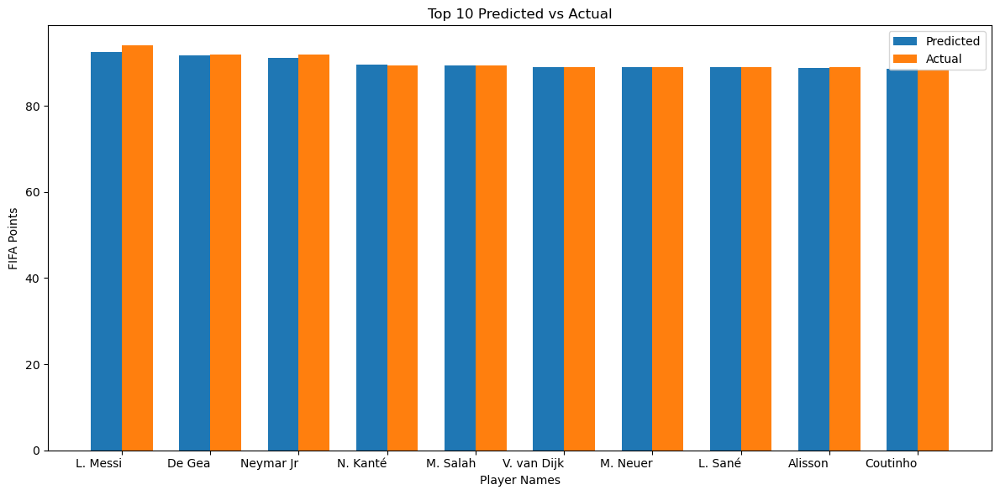

In [92]:

# Lấy chỉ số của tập kiểm tra
test_indices = X_test.index

# Trích xuất các giá trị dự đoán và thực tế cho tập kiểm tra
names = [data.loc[index, 'name'] for index in test_indices]
predicted_values = y_pred
actual_values = y_test.values

# Sắp xếp các dự đoán và giá trị thực theo thứ tự giảm dần của các giá trị dự đoán
sorted_indices = np.argsort(predicted_values)[::-1]
sorted_names = [names[index] for index in sorted_indices]
sorted_predicted_values = [predicted_values[index] for index in sorted_indices]
sorted_actual_values = [actual_values[index] for index in sorted_indices]


top10_names = sorted_names[:10]
top10_predicted_values = sorted_predicted_values[:10]
top10_actual_values = sorted_actual_values[:10]
positions = np.arange(len(top10_names))
bar_width = 0.35

plt.figure(figsize=(12, 6))
plt.bar(positions - bar_width/2, top10_predicted_values, bar_width, label='Predicted')
plt.bar(positions + bar_width/2, top10_actual_values, bar_width, label='Actual')

plt.xlabel('Player Names')
plt.ylabel('FIFA Points')
plt.title('Top 10 Predicted vs Actual')
plt.xticks(positions, top10_names, ha='right')
plt.legend()
plt.tight_layout()
plt.show()

Nhận xét : Từ biểu đồ trên có thể nhận thấy điểm đánh giá của FIFA là khá chính xác, từ đó có thể thấy sự uy tín của FIFA 

## 5. Tự đánh giá

### 5.1 Cá nhân

#### Vũ Hoàng Phúc

**Khó khăn gặp phải khi thực hiện đồ án?**

- Em chưa quen với việc sử dụng git và github
- Dữ liệu này có hơi nhiều cột dẫn tới hơi khó hiểu và khó xử lý
 
**Những điều đã học được?**
  
- Học cách sử dụng git cho khoa học dữ liệu
- Nắm bắt được quy trình của một dự án khoa học dữ liệu
- Rèn luyện các kĩ năng lập trình cho khoa học dữ liệu đã được học


#### Phạm Tấn Anh Vũ

**Khó khăn gặp phải khi chưa thực hiện đồ án?**

- Gặp khó khăn khi mới tập làm việc với git.
- Khó khăn trong việc tìm câu hỏi có ý nghĩa.

**Những điều đã học được?**
  
- Học cách sử dụng git để làm việc nhóm
- Học được quy trình của khoa học dữ liệu.
- Học cách trực quan hoá các loại đồ thị khác nhau.

#### Đặng Thiên Long

**Khó khăn gặp phải khi thực hiện đồ án?**

- Gặp khó khăn trong việc lựa chọn và xây dựng mô hình máy học
- Khó khăn trong việc quản lý thời gian để thực hiện đồ án 


**Những điều đã học được?**

- Học được cách xử lý dữ liệu thực tế
- Hiểu và áp dụng mô hình học máy
- Kỹ năng quản lý thời gian



### 5.2 Nhóm

**Nếu có thêm thời gian nhóm sẽ làm gì?**
- Xử lý code gọn gàng hơn
- Đặt nhiều câu hỏi hơi với sự thú vị và độ phức tạp cao hơn
- Áp dụng thêm các mô hình học mày để dự đoán một số giá trị trong dữ liệu này

## 6. Tài liệu tham khảo
[1] https://www.kaggle.com/code/isabelocastillo/an-lisis-de-jugadores-por-calificaci-n-general    
[2] https://www.kaggle.com/code/maso0dahmed/football-players-data-insight-eda
